# Importing Libraries

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

import plotly as py
import plotly.offline as offline
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
%matplotlib inline

# Importing Data

In [2]:
#Import dataframe for downstream analysis
customersegment=pd.read_csv("C:/Users/lenovo/Desktop/Ecommerce BI/segmented_customers.csv")

In [3]:
customersegment.drop('Unnamed: 0', axis=1, inplace=True)
customersegment.head()

,customer_unique_id,recency,days_since_first_order,frequency,total_payment,avg_payment,segment,sub_segment
0,0000366f3b9a7992bf8c76cfdf3221e2,64,64,1,129.90,129.90,active,active_high
1,0000b849f77a49e4a4ce2b2a4ca5be3f,156,156,1,18.90,18.90,active,active_low
2,0000f46a3911fa3c0805444483337064,431,431,1,69.00,69.00,hot,hot_low
3,0000f6ccb0745a6a4b88665a16c9f078,363,363,1,25.99,25.99,hot,hot_low
4,0004aac84e0df4da2b147fca70cf8255,389,389,1,180.00,180.00,hot,hot_high


In [4]:
customersegment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93358 entries, 0 to 93357
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customer_unique_id      93358 non-null  object 
 1   recency                 93358 non-null  int64  
 2   days_since_first_order  93358 non-null  int64  
 3   frequency               93358 non-null  int64  
 4   total_payment           93358 non-null  float64
 5   avg_payment             93358 non-null  float64
 6   segment                 93358 non-null  object 
 7   sub_segment             93358 non-null  object 
dtypes: float64(2), int64(3), object(3)
memory usage: 5.7+ MB


In [5]:
# Creating work copy
rfm = customersegment[[
    'customer_unique_id',
    'recency',
    'frequency',
    'total_payment',
    'avg_payment'
    ]].copy()

# Exploratory Data Analysis

In [6]:
def rfmscatter(dat, x, y, z):

    '''
    Function to generate a 3D scatter plot

    Input:
    - dat - dataframe
    - x, y, z - 3 features for the three coordinates

    Output:
    - None (interactive 3D scatter plot)
    '''
    x = dat[x]
    y = dat[dat[y]<5][y]
    z = dat[dat[z]<4000][z]


    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=1,
            color=y,               
            colorscale='thermal',
            opacity=0.8
        )
    )])

    fig.update_layout(scene = dict(
        xaxis_title='Recency',
        yaxis_title='Frequency',
        zaxis_title='Monetary'),
        width=700,
        margin=dict(r=20, b=10, l=10, t=10))

    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [8]:
# Generate 3d scatter of rfm, trying to spot clustering
# Deactivated for file size reduction (activate for plot)

rfmscatter(customersegment, 'recency', 'frequency', 'total_payment')

By printing a 3d scatter plot for the three features (Recency, Frequency, Monetary) a clearly visible clustering can not be seen.

# RFM analysis

The RFM analysis segments customers based on three metrics:

Recency
Frequency
Monetary

We need to know that how does the RFM modeling impact the picture? and what conclusions can we draw from the modelling?

# #Recency

C:\Users\lenovo\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



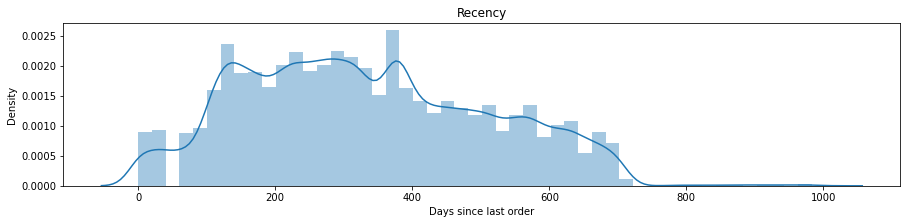

In [9]:
plt.figure(figsize=(15, 3))
sns.distplot(rfm['recency'])

plt.xlabel('Days since last order')
plt.title('Recency');

This chart makes sense because we see that there is the spike at round about 370 days before the reference day. 
That might fall in the time period of the heavy sales event where a lot of customers placed their latest order.

# Frequency

C:\Users\lenovo\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



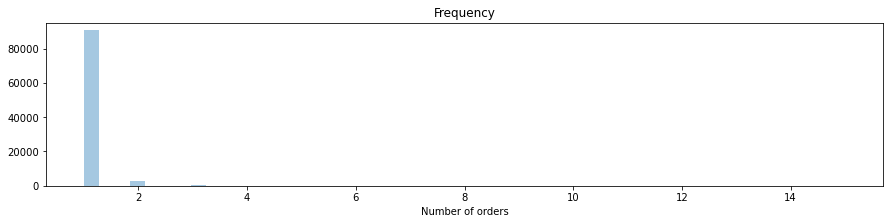

In [10]:
plt.figure(figsize=(15, 3))
sns.distplot(rfm['frequency'], kde=False);

plt.xlabel('Number of orders')
plt.title('Frequency');

As we can see there are many customers which only placed one order.

# Monetary

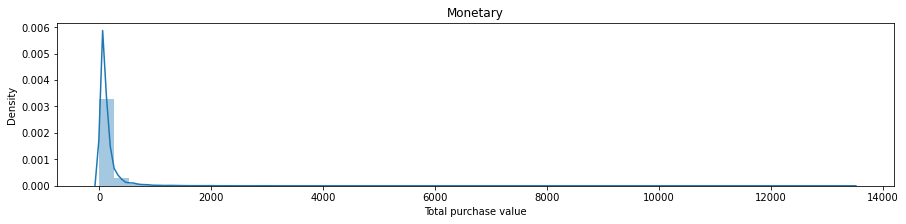

In [11]:
plt.figure(figsize=(15, 3))
sns.distplot(rfm['total_payment']);

plt.xlabel('Total purchase value')
plt.title('Monetary');

In [12]:
# Frequencies:
rfm['frequency'].unique()

array([ 1,  2,  3,  4,  6,  7,  5,  9, 15], dtype=int64)

In [13]:
def assign_frequency(x):
    '''
    Function to assign frequency score

    Input:
    - x - order placed, integer

    Output:
    - F - frequency score
    '''
    
    if x >= 7:
        return 4
    elif x >= 4:
        return 3
    elif x >= 2:
        return 2
    else:
        return 1

In [14]:
# Distribute values to quartiles (for 4 segments) and add to dataframe
rfm['R'] = pd.qcut(rfm['recency'], q=4, labels=range(4, 0, -1))
rfm['F'] = rfm['frequency'].apply(assign_frequency)
rfm['M'] = pd.qcut(customersegment['total_payment'], q=4, labels=range(1, 5))
rfm.head()

,customer_unique_id,recency,frequency,total_payment,avg_payment,R,F,M
0,0000366f3b9a7992bf8c76cfdf3221e2,64,1,129.90,129.90,4,1,3
1,0000b849f77a49e4a4ce2b2a4ca5be3f,156,1,18.90,18.90,4,1,1
2,0000f46a3911fa3c0805444483337064,431,1,69.00,69.00,2,1,2
3,0000f6ccb0745a6a4b88665a16c9f078,363,1,25.99,25.99,2,1,1
4,0004aac84e0df4da2b147fca70cf8255,389,1,180.00,180.00,2,1,4


We now need to label the RFM combination and calculate the RFM score.

In [15]:
# Define- and assign label to dataframe
rfm['segment_RFM'] = rfm['R'].astype(str)+ rfm['F'].astype(str)+ rfm['M'].astype(str)
rfm['score_rfm'] = rfm[['R','F','M']].sum(axis=1)

In [16]:
# These are the customer RFM segments with the appropriate approach suggestion
dict_rfm_tiers = {'Best customer': 'Personalized communication, offer loyalty program, no promotional offers needed',
                  'Big Spender': 'Make them feel valued and offer quality products, encourage to stick with brands',
                  'Loyalist': 'Offer loyalty program',
                  'Potential Loyalists': 'Recommend products and offer discounts', 
                  'Almost Lost': 'Try to win them with limited sales promotions',
                  'Hibernating': 'Make great offers with big discounts',
                  'Lost Customer': 'Do not spent much effort and money to win them'}

In [17]:
def rfm_assiner(df):
    '''
    Function to assign RFM classes according conditions.

    Input:
    - df - dataframe containing RFM score and RFM segment key

    Output:
    - returns a RFM segment class (str)
    '''
    if (int(df['segment_RFM']) >= 434) or (df['score_rfm'] >= 9):
        return 'Best customer'
    elif (df['score_rfm'] >= 8) and (df['M'] == 4):
        return 'Big Spender'
    elif (df['score_rfm'] >= 6) and (df['F'] >= 2):
        return 'Loyalist'
    elif (int(df['segment_RFM']) >= 231) or (df['score_rfm'] >= 6):
        return 'Potential Loyalists'
    elif ((int(df['segment_RFM']) >= 121) and (df['R'] == 1)) or df['score_rfm'] == 5:
        return 'Almost Lost'
    elif (df['score_rfm'] >= 4) and (df['R'] == 1):
        return 'Hibernating'
    else:
        return 'Lost Customer'

In [18]:
rfm['customer_rfm_segment'] = rfm.apply(rfm_assiner, axis=1)

In [19]:
rfm['marketing_approach']= rfm['customer_rfm_segment'].apply(lambda x: dict_rfm_tiers[x])

In [20]:
def plot_waffle_chart(dat, metric, agg, title_txt, group='sub_segment'):
        '''
        Funtion to create a waffle chart. The visualization shows how the
        customer sub-segments are distributed according defined metrics.
        Input:
        - dat - dataframe
        - metric - feature/ kpi metric to visualize
        - agg - method to aggregate
        - title_txt - text to display as chart title
        Outout:
        - waffle chart
        '''
        data_revenue = dict(round(
            dat.groupby(group).agg({metric: agg}))[metric])

        plt.figure(
            FigureClass=Waffle,
            rows=5,
            columns=10,
            values=data_revenue,
            labels=[f"{k, v}" for k, v in data_revenue.items()],
            legend={'loc': 'lower left', 'bbox_to_anchor': (1, 0)},
            figsize=(8, 5)
            )

        plt.title(title_txt)

In [21]:
from pywaffle import Waffle

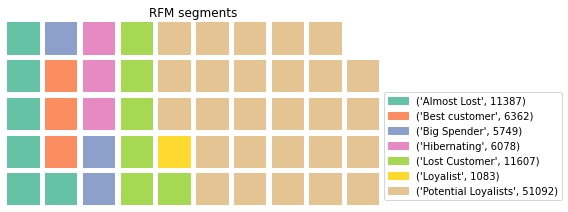

In [22]:
# Vizualize segment sizes with the waffe chart
plot_waffle_chart(rfm, 'customer_unique_id', 'count', 'RFM segments', 'customer_rfm_segment')

In [23]:
# Make a clean table for presentation
df_tbl_rfm = rfm.groupby('customer_rfm_segment').agg(
    Count = ('customer_unique_id', 'count'),
    Recency = ('recency', 'mean'),
    Frequency = ('frequency', 'mean'),
    Monetary = ('total_payment', 'mean'),
    Strategy = ('marketing_approach', 'unique'),
).round(1)
df_tbl_rfm

,Count,Recency,Frequency,Monetary,Strategy
customer_rfm_segment,,,,,
Almost Lost,11387,474.3,1.0,92.0,[Try to win them with limited sales promotions]
Best customer,6362,127.9,1.2,378.4,"[Personalized communication, offer loyalty pro..."
Big Spender,5749,264.4,1.1,371.2,[Make them feel valued and offer quality produ...
Hibernating,6078,572.7,1.0,67.3,[Make great offers with big discounts]
Lost Customer,11607,479.8,1.0,29.6,[Do not spent much effort and money to win them]
Loyalist,1083,392.7,2.1,197.8,[Offer loyalty program]
Potential Loyalists,51092,271.3,1.0,143.3,[Recommend products and offer discounts]


# Conclusion

The order frequency and order amounts are concentrated on the lower end. 

The biggest RFM segment is the group of Potential Loyalists. These are customers that need to be targeted with offers and discounts in order to make the business successful.

There is a good base of Best Customers, which is good news for the business.

Some effort needs to be spent to target hibernating customers and customers which are almost lost

# K-Means Clustering

# K-Means Clustering is a method that supports identifying clusters in unlabeled data. 
We will use the existing dataset and apply sklearns K-means algorithm to find underlying segments that are different from the aribrarily chosen RFM classes.

Step one is to normalize the data to have all features on the same scale. 
This is to avoid that one feature dominates others.

In [24]:
df_rfm_trans = rfm[['recency', 'frequency', 'total_payment']] # dataframe we want to use for clustering
scaler = StandardScaler() # set up scaler
scaler.fit(df_rfm_trans) # fit our data to the scaler
df_rfm_norm = scaler.transform(df_rfm_trans) # trasnform data with scaler
df_rfm_norm = pd.DataFrame(data=df_rfm_norm, index=df_rfm_trans.index, columns=df_rfm_trans.columns) # convert back to dataframe

In [25]:
# Check
df_rfm_norm.head()

,recency,frequency,total_payment
0,-1.521862,-0.159829,-0.076400
1,-1.000995,-0.159829,-0.528673
2,0.555943,-0.159829,-0.324539
3,0.170955,-0.159829,-0.499785
4,0.318156,-0.159829,0.127734


Step two is to decide for clusters in K-means

In [26]:
# Let's start with 2 clusters
k_means = KMeans(n_clusters=2, random_state=1)
k_means.fit(df_rfm_norm)

KMeans(n_clusters=2, random_state=1)

In [29]:
# Cretate dataframe to display table
cluster = k_means.labels_
df_rfm_2 = rfm.assign(Cluster=cluster)
df_group_2 = df_rfm_2.groupby('Cluster')
df_group_2.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'total_payment': ['mean', 'count']
  }).round(1)

recency frequency total_payment       
           mean      mean          mean  count
Cluster                                       
0         333.7       1.0         142.5  90534
1         302.9       2.1         345.8   2824

In [30]:
# Calculate standard error
k_means.inertia_

201654.78808807008

The number of clusters impact the standard error. Higher number of clusters will lower the error, but Let's automate the process.

By plotting the error against the number of clusters we can determin the condition at which the gain of information becomes marginal ("Ellbow" method).

In [31]:
def k_means_func(dat, n_clusters):
    '''
    Function to calculate the standard error for a given number of clusters.

    Inputs:
    - dat - dataframe with normalized data
    - n_clusters - number of clusters

    Output:
    - sse - standard error
    '''
    k_means = KMeans(n_clusters=n_clusters, random_state=1)
    k_means.fit(df_rfm_norm)
    
    return k_means.inertia_

In [32]:
# Generating dictionary with errors
dict_k_sse = {}
for i in range(1, 10):
    dict_k_sse[i] = k_means_func(df_rfm_norm, i)

In [33]:
dict_k_sse

{1: 280074.0000000003,
 2: 201654.78808807008,
 3: 138151.15493729283,
 4: 94924.3689562073,
 5: 79702.21475304628,
 6: 65685.55774585319,
 7: 56233.47606087297,
 8: 47639.2024517948,
 9: 42722.07345681085}

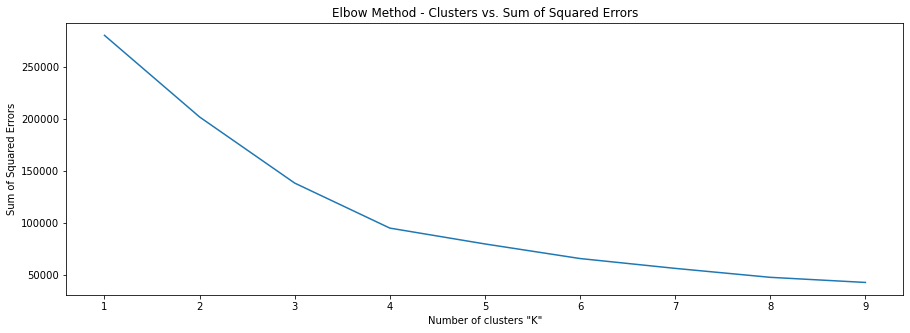

In [34]:
plt.figure(figsize=(15, 5))
sns.lineplot(x=list(dict_k_sse.keys()), y=list(dict_k_sse.values()))

plt.xlabel('Number of clusters "K"')
plt.ylabel('Sum of Squared Errors')
plt.title('Elbow Method - Clusters vs. Sum of Squared Errors');

The Elbow Method revealed that a cluster number of 4 is a suitable value.

In [37]:
# considering 4 clusters
k_means = KMeans(n_clusters=4, random_state=1)
k_means.fit(df_rfm_norm)
cluster = k_means.labels_
df_rfm_4 = rfm.assign(Cluster=cluster)
df_group_4 = df_rfm_4.groupby('Cluster')
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'total_payment': ['mean', 'count']
  }).round(1)

recency frequency total_payment       
           mean      mean          mean  count
Cluster                                       
0         335.7       1.0        1387.6   1750
1         502.6       1.0         121.8  38524
2         302.4       2.1         270.4   2770
3         204.4       1.0         119.4  50314

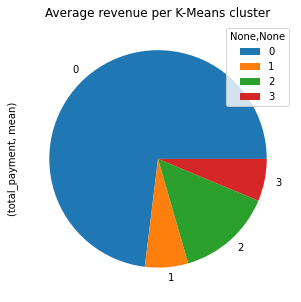

In [38]:
# Plot mean purchase value per K-Means cluster
plt.figure(figsize=(10, 5))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'total_payment': ['mean', 'count']
  }).round(1)['total_payment', 'mean'].plot(kind='pie', legend=True)
  
plt.title('Average revenue per K-Means cluster');

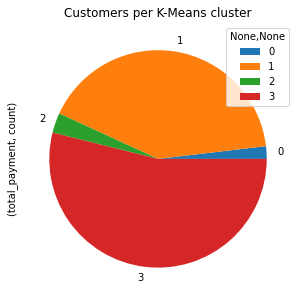

In [39]:
# Plot customers per K-Means cluster
plt.figure(figsize=(10, 5))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'total_payment': ['mean', 'count']
  }).round(1)['total_payment', 'count'].plot(kind='pie', legend=True)

plt.title('Customers per K-Means cluster');

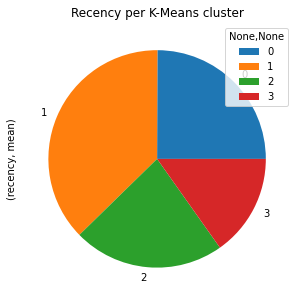

In [40]:
# Plot recency per K-Means cluster
plt.figure(figsize=(10, 5))
df_group_4.agg({
    'recency': 'mean',
    'frequency': 'mean',
    'total_payment': ['mean', 'count']
  }).round(1)['recency', 'mean'].plot(kind='pie', legend=True)

plt.title('Recency per K-Means cluster');

In [41]:
x = df_rfm_4['recency']
y = df_rfm_4['frequency']
z = df_rfm_4['total_payment']

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color=df_rfm_4['Cluster'],               
        #colorscale='thermal',
        opacity=0.8
    )
 )])

fig.update_layout(scene = dict(
    xaxis_title='Recency',
    yaxis_title='Frequency',
    zaxis_title='Monetary'),
    width=700,
    margin=dict(r=20, b=10, l=10, t=10))

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

# Conclusion

K-Means clustering reveals that four customer segments generates an effective fit for the data